#   **Lab 1 REPORT done by : BOUHOUIA Yousra**
## Image Manipulation and Point Operations in Python
In this lab, we will explore fundamental techniques for image manipulation and point operations using Python.
The objectives of this lab include:

- Creating and visualizing image matrices.
- Reading, displaying, and processing images using libraries such as OpenCV and Matplotlib.
- Performing histogram-based operations, such as equalization and quantization, to enhance image contrast.
- Analyzing the effects of these operations on image quality and entropy.

---

### Understanding the Libraries Used
Before starting the lab, provide a brief definition of the following libraries and their role in image processing:

- **OpenCV**: OpenCV is a computer vision library used for reading, processing, and analyzing images and videos.
In this lab, it is used for image loading, color conversion, and basic image processing operations.

- **NumPy**: NumPy is a numerical computing library that provides efficient multi-dimensional array operations.
It is used to represent images as matrices and perform mathematical manipulations on pixel values.

- **Matplotlib**: Matplotlib is a visualization library used to display images, plots, and histograms.
In this lab, it is used to visualize images and analyze pixel intensity distributions.

If not installed, you can install them using `pip install opencv-python numpy matplotlib`.

In [1]:
# Import necessary libraries
import os
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt


# Manipulation 1: Matrix Creation and Visualization
In this section, we will:
1. Create specific matrices using vectors A, B, and C.
2. Convert the matrices to `uint8` format.
3. Visualize the matrices using OpenCV and Matplotlib.

### Task 1: Matrix Creation
- **Matrix I1**: 64 rows identical to vector A.  
- **Matrix I2**: A 4x4 block of '1' surrounded by rows of 0 (based on vectors B and C).  
- **Matrix I3**: A 2x2 tiling of matrix I2.  



In [2]:
# Task 1 — Matrix creation (I1, I2, I3)
A = np.arange(64, dtype=np.uint8)
B = np.zeros(64, dtype=np.uint8)
start = 30
B[start:start+4] = 1
C = np.zeros(64, dtype=np.uint8)

I1 = np.tile(A, (64, 1))
I2 = np.vstack([
    np.tile(C, (30, 1)),
    np.tile(B, (4, 1)),
    np.tile(C, (30, 1)),
]).astype(np.uint8)
I3 = np.tile(I2, (2, 2))

print("A shape:", A.shape, "dtype:", A.dtype)
print("I1 shape:", I1.shape, "dtype:", I1.dtype)
print("I2 shape:", I2.shape, "dtype:", I2.dtype)
print("I3 shape:", I3.shape, "dtype:", I3.dtype)


A shape: (64,) dtype: uint8
I1 shape: (64, 64) dtype: uint8
I2 shape: (64, 64) dtype: uint8
I3 shape: (128, 128) dtype: uint8


### Task 2: Convert Matrices to uint8 and Visualize
- Convert matrices to `uint8` format using `np.uint8()`.  
- Visualize the matrices using both OpenCV and Matplotlib.  
- OpenCV displays images in a new window, while Matplotlib embeds them in the notebook.  

---

### Notes:
- `cv.imshow` opens images in a new window, which might not work in Google Colab.  
- Use Matplotlib (`plt.imshow`) in Colab to visualize images directly in the notebook.  
- `uint8` conversion ensures values stay within the valid image range (0-255).  


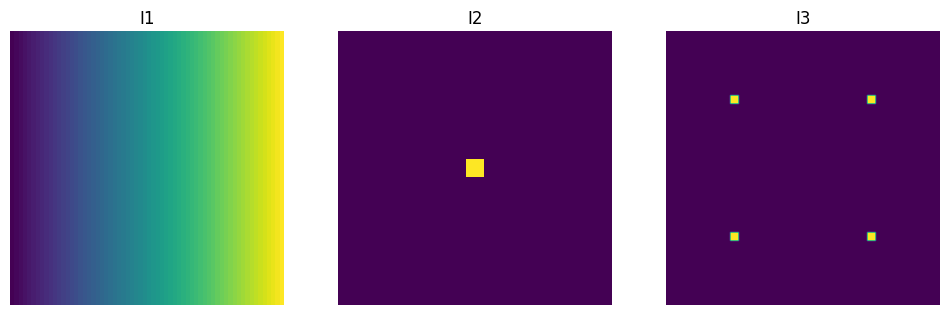

In [ ]:
import matplotlib.pyplot as plt

I1_u8 = np.uint8(I1)
I2_u8 = np.uint8(I2 * 255) 
I3_u8 = np.uint8(I3 * 255)

plt.figure(figsize=(12,4))
plt.subplot(1,3,1); plt.imshow(I1_u8,); plt.title("I1"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(I2_u8,); plt.title("I2"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(I3_u8,); plt.title("I3"); plt.axis('off')
plt.show()

## Manipulation 2: Image Reading and RGB Channel Operations
In this section, we will:
1. Read and visualize the image `mandrill.png`.
2. Display image properties (size, depth).
3. Separate RGB channels and visualize them independently.
4. Perform RGB channel swapping and save channels in different formats.
5. Convert the image to grayscale using two methods and compare the results.


### Task 1: Read and Display Image
- Use `cv.imread` to load the image.
- Note: OpenCV loads images in BGR format, so convert to RGB using `cv.cvtColor`.
- Visualize the image using Matplotlib.


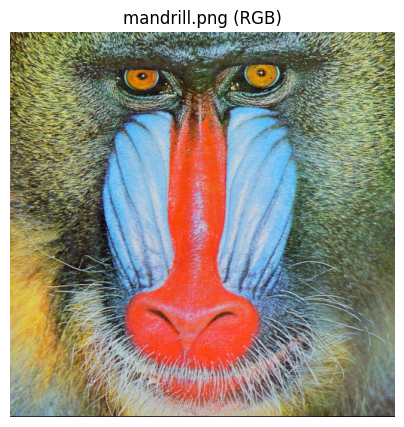

In [4]:
# Task 1 — Read, convert (BGR -> RGB), and display mandrill.png

img_bgr = cv.imread("./images/mandrill.png")

if img_bgr is None:
    raise FileNotFoundError(
        "Could not find ./images/mandrill.png. "
        "Make sure the 'images' folder is next to this notebook."
    )

img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)

plt.figure(figsize=(5, 5))
plt.imshow(img_rgb)
plt.title("mandrill.png (RGB)")
plt.axis("off")
plt.show()


### Task 2: Display Image Properties
- Display the image dimensions and data type.
- This provides insight into the image size, channels, and pixel depth.


In [5]:
# Task 2 — Display image properties

print("Shape (H, W, C):", img_rgb.shape)
print("Data type:", img_rgb.dtype)
print("Min/Max values:", img_rgb.min(), img_rgb.max())


Shape (H, W, C): (512, 512, 3)
Data type: uint8
Min/Max values: 0 255


### Task 3: Separate and Visualize RGB Channels
- Split the image into R, G, and B channels using `cv.split()`.
- Visualize each channel separately.

`B, G, R = cv.split(your_BGR_image)`

or 

`R, G, B = cv.split(your_RGB_image)`

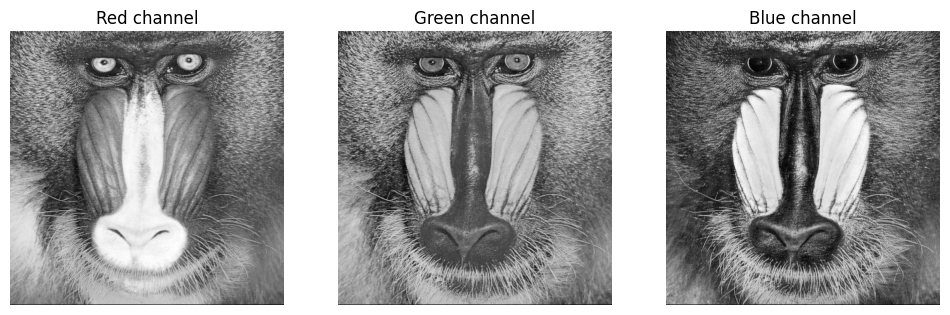

In [6]:
# Task 3 — Separate and visualize RGB channels

R, G, B = cv.split(img_rgb)

fig, axes = plt.subplots(1, 3, figsize=(12, 4))
for ax, ch, name in zip(axes, [R, G, B], ["Red channel", "Green channel", "Blue channel"]):
    ax.imshow(ch, cmap="gray", vmin=0, vmax=255)
    ax.set_title(name)
    ax.axis("off")
plt.show()


### Task 4: RGB Channel Swapping
- Swap the RGB channels to visualize different combinations.
- Perform all combinations (RGB, RBG, GRB, GBR, BRG, BGR).

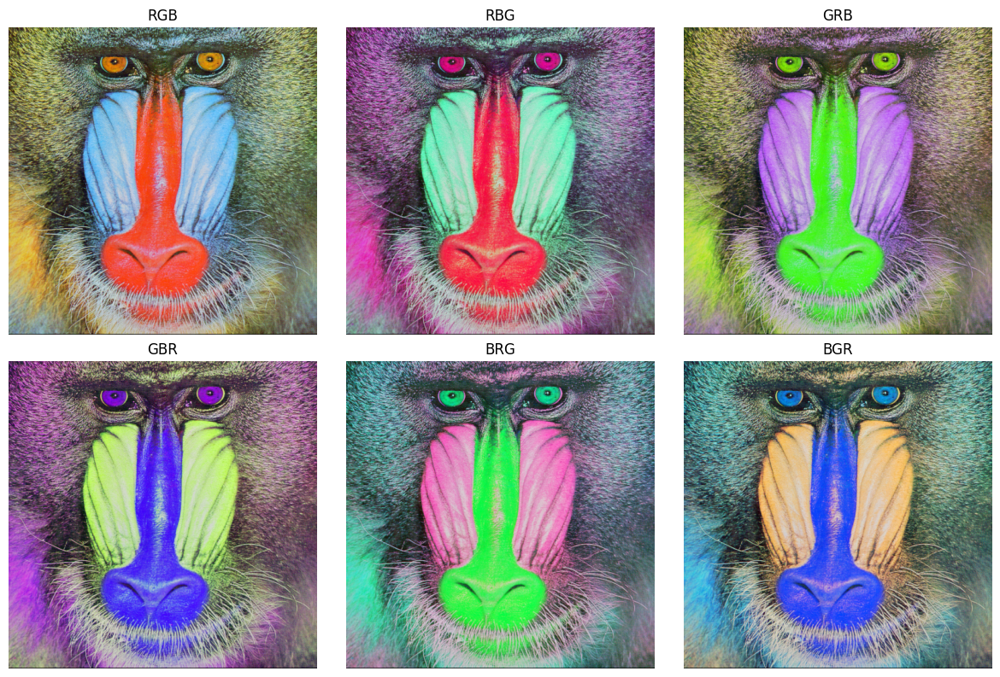

In [7]:
# Task 4 — RGB channel swapping (all 6 permutations)

channels = {"R": R, "G": G, "B": B}
perms = ["RGB", "RBG", "GRB", "GBR", "BRG", "BGR"]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
axes = axes.ravel()

for ax, p in zip(axes, perms):
    swapped = cv.merge([channels[p[0]], channels[p[1]], channels[p[2]]])
    ax.imshow(swapped)
    ax.set_title(p)
    ax.axis("off")

plt.tight_layout()
plt.show()


# Remark 
This task demonstrate how color information in an image depends entirely on the order and combination of color channels.Although the pixel values remain the same, changing the arrangement of the Red, Green, and Blue channels produces significantly different visual result. 
> This highlight that colors are created by mixing channel intensities in a specific order.

### Task 5: Save RGB Channels in Different Formats
- Save the Red channel as `.png`, Green as `.bmp`, and Blue as `.jpeg`.
- Use `cv.imwrite` to save images.


In [8]:
# Task 5 — Save RGB channels in different formats

os.makedirs("./outputs", exist_ok=True)

# Save single-channel images
cv.imwrite("./outputs/red.png", R)     # PNG
cv.imwrite("./outputs/green.bmp", G)   # BMP
cv.imwrite("./outputs/blue.jpeg", B)   # JPEG

print("Saved:")
print(" - ./outputs/red.png")
print(" - ./outputs/green.bmp")
print(" - ./outputs/blue.jpeg")


Saved:
 - ./outputs/red.png
 - ./outputs/green.bmp
 - ./outputs/blue.jpeg


### Task 6: Convert an image to grayscale.

- Use `cv.cvtColor` to convert the image to grayscale.
- Make sure your are using the right transformation (BGR2GRAY or RGB2GRAY) according to your image format.
- Visualize the grayscale image.



Alternatively, use the previously extracted R, G, and B channels to manually compute the grayscale image using the following formula:

1. Weighted Grayscale Conversion:

`Igray = 0.2989 * R + 0.5870 * G + 0.1140 * B`

2. Simple Average Method:

`Igray = Mean(R, G, B)`

After applying this transformation, ensure that you properly visualize and compare the grayscale output from both methods to confirm consistency.

### Question:

- These coefficients `(0.2989, 0.5870, 0.1140)` are not arbitrary—they come from a standard model used in image processing.

- How are these coefficients determined? What do they represent, and why are they used instead of a simple average?

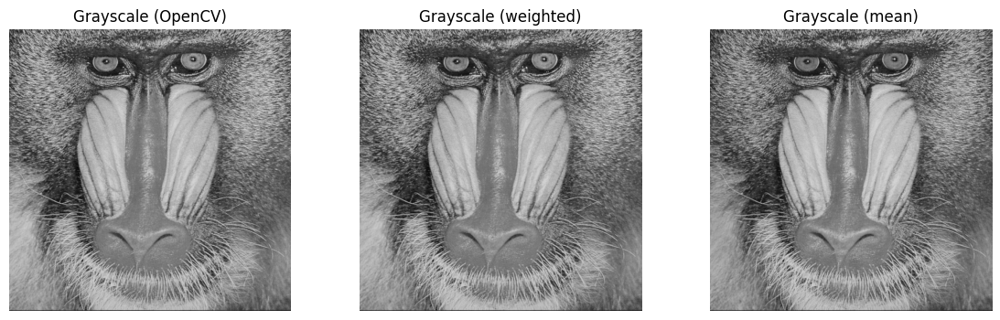

Mean abs diff (OpenCV vs weighted): 0.5138626098632812
Mean abs diff (OpenCV vs mean): 6.514652252197266


In [9]:
# Task 6 — Convert to grayscale (OpenCV + manual methods) and compare

# 1) OpenCV conversion
gray_cv = cv.cvtColor(img_rgb, cv.COLOR_RGB2GRAY)

# 2) Manual weighted conversion (same idea as ITU-R BT.601 luma)
gray_weighted = (0.2989 * R + 0.5870 * G + 0.1140 * B)

# 3) Manual simple average
gray_mean = (R.astype(np.float32) + G.astype(np.float32) + B.astype(np.float32)) / 3.0

# Convert manual results to uint8 for display
gray_weighted_u8 = np.clip(gray_weighted, 0, 255).astype(np.uint8)
gray_mean_u8 = np.clip(gray_mean, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, im, title in zip(
    axes,
    [gray_cv, gray_weighted_u8, gray_mean_u8],
    ["Grayscale (OpenCV)", "Grayscale (weighted)", "Grayscale (mean)"],
):
    ax.imshow(im, cmap="gray", vmin=0, vmax=255)
    ax.set_title(title)
    ax.axis("off")
plt.show()

# Numeric comparison (how close are they?)
print("Mean abs diff (OpenCV vs weighted):", np.mean(np.abs(gray_cv.astype(np.int16) - gray_weighted_u8.astype(np.int16))))
print("Mean abs diff (OpenCV vs mean):", np.mean(np.abs(gray_cv.astype(np.int16) - gray_mean_u8.astype(np.int16))))


# Analysis

### Quantitative Comparison

| Method Compared | Mean Absolute Difference | Interpretation |
|-----------------|--------------------------|----------------|
| OpenCV vs Weighted (Luminance) | 0.51 | Very small difference, results are nearly identical |
| OpenCV vs Simple Average | 6.51 | Large difference, noticeable change in brightness |

### Analysis of Results

The very low mean absolute difference between **OpenCV grayscale conversion** and the **weighted luminance method** indicates that both approaches produce almost identical grayscale images. This confirms that OpenCV internally uses a luminance-based model similar to the weighted formula.

In contrast, the significantly higher difference between **OpenCV** and the **simple average method** shows that treating all color channels equally leads to noticeable discrepancies in brightness. This occurs because the simple average does not account for the human eye’s varying sensitivity to different colors, particularly its higher sensitivity to green.

### Interpretation

- The **weighted luminance method** closely matches OpenCV’s implementation and accurately preserves perceived brightness.
- The **simple average method** introduces brightness distortions and is therefore less suitable for realistic image representation.
- These results validate why standard computer vision libraries rely on luminance-based grayscale conversion instead of simple averaging.

### Conclusion

The results show that OpenCV’s grayscale conversion closely aligns with the luminance-based weighted method, while the simple average method produces significantly different results. This confirms that perceptual luminance models are essential for accurate grayscale representation.


### Task 7: Negative Transformation
The negative transformation is a simple yet powerful operation applied to images. It inverts the pixel intensities of the image, enhancing white or gray details embedded in darker regions.

The formula for the negative transformation is:

    I_negative = 255 - I

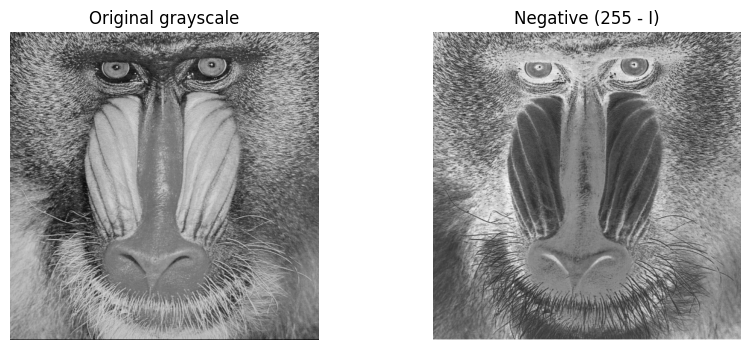

In [ ]:
# Task 7 — Negative transformation

neg = 255 - gray_cv

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale")
axes[0].axis("off")

axes[1].imshow(neg, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Negative (255 - I)")
axes[1].axis("off")
plt.show()


# Analysis 
From the comparison between the original grayscale image and its negative, we observe that:

- Bright regions in the original image become dark in the negative image
- Dark regions become bright
- The shape, edges, and structure of the image remain unchanged
- Only the brightness values are inverted

The negative transformation is used to highlight details by reversing brightness while keeping the image structure unchanged.



### Task 8: Contrast and Brightness Adjustment
1. **Define what contrast and brightness adjustment is.**
   - Provide a brief explanation of how contrast and brightness adjustment works.
   - Include its formula:
      
     

   I_new = alpha x I + beta


Where:
   - I_new: Adjusted pixel intensity
   - I: Original pixel intensity
   - alpha: Gain (controls contrast)
   - beta: Bias (adjusts brightness)
Increasing alpha enhances contrast, and adjusting beta shifts brightness.


2. **Explain the roles of alpha and beta:**
   - What does alpha (gain) control?
   - What does beta (bias) control?
   - How do changes to these parameters affect the appearance of an image?


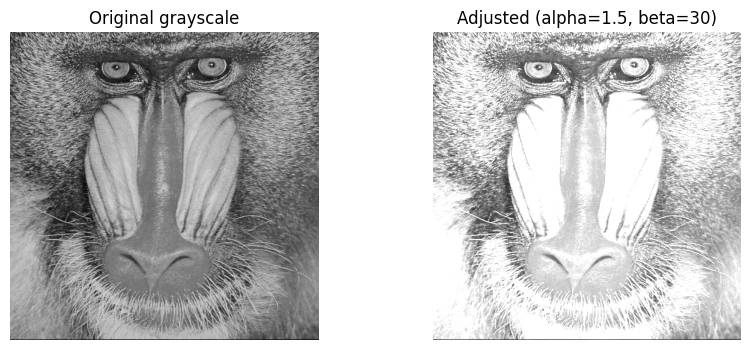

In [11]:
# Task 8 — Contrast and brightness adjustment: I_new = alpha * I + beta

alpha = 1.5  # contrast (gain)
beta = 30    # brightness (bias)

adjusted = cv.convertScaleAbs(gray_cv, alpha=alpha, beta=beta)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale")
axes[0].axis("off")

axes[1].imshow(adjusted, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Adjusted (alpha={alpha}, beta={beta})")
axes[1].axis("off")
plt.show()


## Analysis and answering questions

- Contrast and brightness adjustment is a point-wise image transformation used to modify the appearance of an image by changing pixel intensity values.
---

### 2. Role of Alpha (α) and Beta (β)

#### Role of Alpha (Contrast Control)
The parameter **alpha (α)** controls the **contrast** of the image.

- If α > 1: contrast is increased  
- If α = 1: contrast remains unchanged  
- If 0 < α < 1: contrast is reduced  

Increasing alpha makes bright pixels brighter and dark pixels darker, increasing the difference between pixel intensities.

---

#### Role of Beta (Brightness Control)
The parameter **beta (β)** controls the **brightness** of the image.

- If β > 0: the image becomes brighter  
- If β < 0: the image becomes darker  
- If β = 0: brightness remains unchanged  

Beta shifts all pixel values up or down without changing the contrast.

---

### Effect on Image Appearance (Applied Result)

After applying contrast and brightness adjustment with **α = 1.5** and **β = 30**, the adjusted image appears significantly brighter and more contrasted compared to the original grayscale image.

The increase in **alpha (α = 1.5)** enhances contrast by amplifying the differences between pixel intensities. As a result, edges and textures, such as facial details and fur patterns, become more pronounced.

The positive **beta (β = 30)** shifts pixel intensity values upward, increasing overall brightness. This makes lighter regions appear brighter, while some areas approach saturation, especially in already bright regions.

The combined effect improves the visibility of several features but may also reduce detail in highly bright areas due to overexposure.

---

### Conclusion

Applying contrast and brightness adjustment using α = 1.5 and β = 30 enhances image contrast and brightness, making features more visible and distinct. However, excessive parameter values can lead to loss of detail in bright regions, highlighting the importance of choosing appropriate values for optimal image quality.


### Task 9: Gamma Transformation

Gamma correction applies a non-linear adjustment to pixel intensities.

#### Formula:
$$
I_{\gamma} = 255 \times \left(\frac{I}{255}\right)^{\gamma}
$$
#### Where:
- I_gamma: Gamma-corrected pixel intensity
- I: Original pixel intensity
- gamma: Gamma value
  - gamma > 1: Darkens the image and enhances darker regions.
  - gamma < 1: Brightens the image and enhances brighter regions.

---

Explain the Utility of Gamma Transformation
1. Why is gamma correction important in image processing?
2. In what situations is gamma correction useful?
3. How does gamma correction help in adjusting images for different display devices?
4. What happens to the histogram of an image when applying gamma correction with gamma > 1 vs. gamma < 1?

*Write your answers below:*

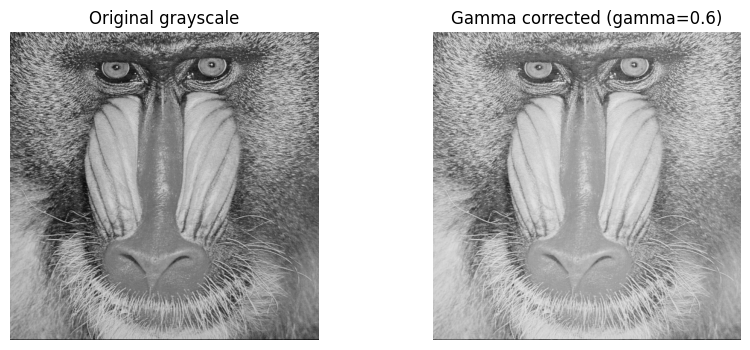

In [12]:
# Task 9 — Gamma transformation (gamma correction)

gamma = 0.6  # try <1 to brighten, >1 to darken

# Normalize to [0,1], apply power, and scale back
gray_norm = gray_cv.astype(np.float32) / 255.0
gamma_img = np.power(gray_norm, gamma) * 255.0
gamma_img_u8 = np.clip(gamma_img, 0, 255).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale")
axes[0].axis("off")

axes[1].imshow(gamma_img_u8, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Gamma corrected (gamma={gamma})")
axes[1].axis("off")
plt.show()


# Analysis

#### 1. Why is gamma correction important in image processing?
Gamma correction is important because human vision and display devices do not respond linearly to brightness. Without gamma correction, images may appear too dark or too bright, even if the pixel values are correct. Gamma transformation helps adjust pixel intensities so that images look visually natural to the human eye.

---

#### 2. In what situations is gamma correction useful?
Gamma correction is useful when:
- Images appear too dark or too bright
- Enhancing details in shadowed or bright regions
- Preparing images for visualization and display
- Preprocessing images before further analysis in computer vision tasks

---

#### 3. How does gamma correction help in adjusting images for different display devices?
Different display devices (such as monitors, cameras, and projectors) have different brightness responses. Gamma correction compensates for these differences by adjusting pixel intensities, ensuring that images appear consistent and correctly illuminated across different devices.

---

#### 4. Effect of Gamma Correction on the Histogram
- When **γ > 1**:  
  Pixel intensities are shifted toward lower values, making the image darker. The histogram moves toward the left, emphasizing darker regions.

- When **γ < 1**:  
  Pixel intensities are shifted toward higher values, making the image brighter. The histogram moves toward the right, enhancing brighter regions.

---

### Conclusion
Gamma transformation provides non-linear control over image brightness, allowing enhancement of dark or bright regions while maintaining image details. It is a crucial tool for visual correction and display adaptation in image processing.


### Task 10: Thresholding (Binarization)

Thresholding is a technique used to convert a grayscale image into a binary image.  
The process involves setting a threshold value \( T \), and each pixel is assigned either **0 (black)** or **255 (white)** based on the condition:

- If pixel intensity \( I(x, y) \) is greater than \( T \), set it to 255 (white).
- Otherwise, set it to 0 (black).

#### Formula:
I_bin(x, y) =
- 255, if I(x, y) > T
- 0, otherwise

This process simplifies the image and is useful in object detection and segmentation.


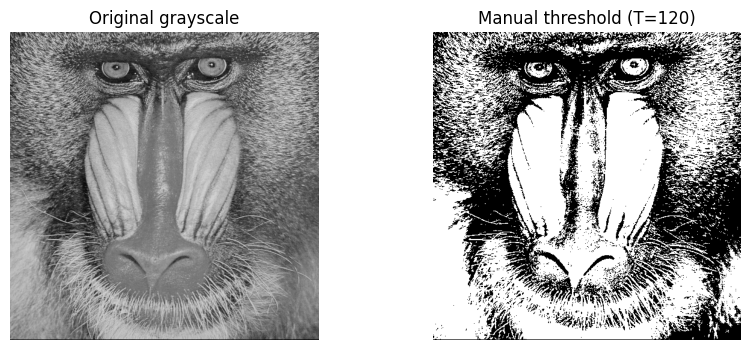

In [13]:
# Task 10 — Manual thresholding (binarization)

T = 120  # threshold value (change to experiment)

binary_manual = np.where(gray_cv > T, 255, 0).astype(np.uint8)

fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale")
axes[0].axis("off")

axes[1].imshow(binary_manual, cmap="gray", vmin=0, vmax=255)
axes[1].set_title(f"Manual threshold (T={T})")
axes[1].axis("off")
plt.show()


### Analysis

Thresholding is an image processing technique that converts a grayscale image into a binary image with only two values: black (0) and white (255). Each pixel is compared to a threshold value \( T \) and classified accordingly.

Thresholding is used to:
- Separate objects from the background
- Simplify image analysis
- Support object detection and segmentation


### Effect on Image 

After applying manual thresholding with \( T = 120 \), the image is converted into a binary form where bright regions are clearly separated from darker areas. However, some details are lost and noise appears due to the fixed threshold being sensitive to intensity variations.


---

### Task 11: Otsu's Thresholding

Otsu’s method is an advanced form of thresholding that automatically determines the **optimal threshold value \( T \)**.  
Instead of manually setting \( T \), Otsu’s algorithm finds a value that minimizes the variance between foreground and background pixel intensities.

#### Key Advantages:
- **Automatic threshold selection** (no need to choose \( T \) manually).
- **Works well on images with a bimodal histogram** (two distinct peaks in intensity distribution).
- **Reduces sensitivity to lighting variations.**


Compare the results of both methods **manual thresholding** and **Otsu's Thresholding**

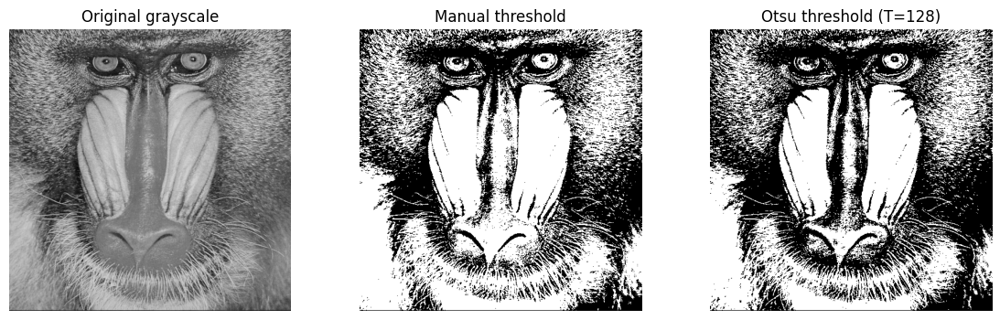

In [14]:
# Task 11 — Otsu's thresholding (automatic threshold selection)

# cv.threshold returns (threshold_value, output_image)
T_otsu, binary_otsu = cv.threshold(gray_cv, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

fig, axes = plt.subplots(1, 3, figsize=(14, 4))
axes[0].imshow(gray_cv, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale")
axes[0].axis("off")

axes[1].imshow(binary_manual, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Manual threshold")
axes[1].axis("off")

axes[2].imshow(binary_otsu, cmap="gray", vmin=0, vmax=255)
axes[2].set_title(f"Otsu threshold (T={T_otsu:.0f})")
axes[2].axis("off")
plt.show()


### Comparison of Manual Thresholding and Otsu’s Thresholding

| Aspect | Manual Thresholding | Otsu’s Thresholding |
|------|--------------------|---------------------|
| Threshold selection | Manually chosen (e.g. T = 120) | Automatically computed (T = 128) |
| User dependency | High | None |
| Sensitivity to lighting | High | Lower |
| Noise in result | More visible | Reduced |
| Object-background separation | Inconsistent in some areas | More consistent |
| Adaptability | Low | High |

---

### Analysis
Manual thresholding produces a binary image but is sensitive to the chosen threshold value, which can introduce noise and loss of detail. Otsu’s thresholding automatically selects an optimal threshold based on image statistics, resulting in cleaner segmentation and better separation between foreground and background.

---

### Conclusion
Otsu’s thresholding provides more reliable and consistent results than manual thresholding, making it better suited for automated image segmentation tasks.


### Now, repeat Tasks 8 to 11 using different images of your choice and analyze the results.

---

# Manipulation 3: Quantize a Grayscale Image
### Understanding Quantization and Histograms
1- Quantization is the process of reducing the number of intensity levels in an image. In grayscale images, pixel values range from 0 to 255, representing 256 possible shades. By reducing these levels (e.g., to 128, 64, 32, etc.), we limit the number of shades, simplifying the image but potentially reducing its quality.

2- A histogram represents the distribution of pixel intensities in an image. It shows how frequently each intensity value appears. When we quantize an image, we effectively "group" similar intensity values, leading to a histogram with fewer distinct peaks. Observing these histograms helps us understand how information is lost and how the image’s appearance is affected.

---

Instructions
In this section, you will:

1- Quantize the grayscale image into different levels (128, 64, 32, 16, 8, 4, 2).
2- Visualize the quantized images and their histograms.
3- Observe the effects of reduced levels on image quality.

To quantize the grayscale image, apply the following formula:

`quantized_image = (Img_gray // (256 / levels)) * (256 / levels)`


### Task 1: Image Quantization
The goal is to observe how reducing the number of intensity levels affects image quality.

Steps:
Convert the image to grayscale using cv.cvtColor.

Define different quantization levels to reduce the number of shades in the image (e.g., quant_levels = {128, 64, 32, 16, 8, 4, 2}).

Apply quantization using the formula above.

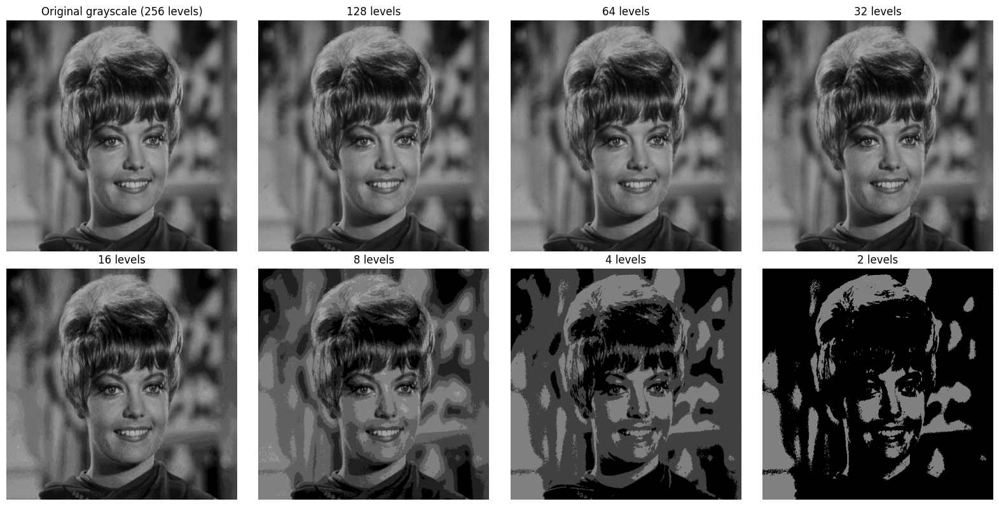

In [15]:
# Task 1 — Quantize a grayscale image (zelda.png)

img_bgr = cv.imread("./images/zelda.png")
if img_bgr is None:
    raise FileNotFoundError(
        "Could not find ./images/zelda.png. Make sure the 'images' folder exists."
    )

img_gray = cv.cvtColor(img_bgr, cv.COLOR_BGR2GRAY)

# Quantization levels (number of gray levels to keep)
quant_levels = [128, 64, 32, 16, 8, 4, 2]

quantized_images = {}
for L in quant_levels:
    # Map 0..255 into L bins: bin_size = 256/L
    bin_size = 256 // L
    q = (img_gray // bin_size) * bin_size
    quantized_images[L] = q.astype(np.uint8)

# Visualize
fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

axes[0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0].set_title("Original grayscale (256 levels)")
axes[0].axis("off")

for i, L in enumerate(quant_levels, start=1):
    axes[i].imshow(quantized_images[L], cmap="gray", vmin=0, vmax=255)
    axes[i].set_title(f"{L} levels")
    axes[i].axis("off")

# Hide any remaining axes
for j in range(len(quant_levels)+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


# Analysis of Grayscale Image Quantization

 >The quantization results clearly demonstrate the effect of reducing the number of intensity levels on image quality and visual perception.

> At higher quantization levels (16 and 8 levels), the image preserves most of its visual details and smooth intensity transitions. Facial features, textures, and edges remain clearly recognizable, with only minor loss of subtle shading.

> As the number of levels decreases (4 and 2 levels), the image becomes increasingly posterized. Smooth gradients are replaced by large uniform regions, leading to loss of fine details and introduction of visible artifacts. At 2 levels, the image is reduced to a nearly binary form, where only major structures and strong contrasts are preserved.

> Overall, quantization highlights the trade-off between image simplicity and visual quality. While fewer intensity levels simplify the image and reduce data complexity, they also significantly reduce detail and realism, emphasizing the importance of selecting an appropriate number of quantization levels depending on the application.


### Task 2: Histogram Analysis
- Compute and display histograms for each quantized image.
- Use `cv.calcHist` to compute the histogram.

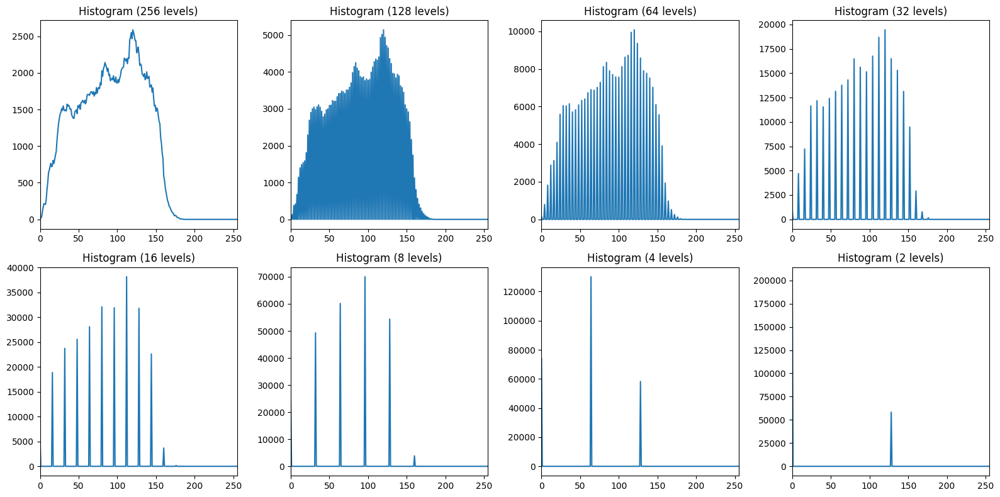

In [16]:
# Task 2 — Histogram analysis for each quantized image

def plot_hist(img, title, ax):
    hist = cv.calcHist([img], [0], None, [256], [0, 256])
    ax.plot(hist)
    ax.set_title(title)
    ax.set_xlim([0, 255])

fig, axes = plt.subplots(2, 4, figsize=(16, 8))
axes = axes.ravel()

plot_hist(img_gray, "Histogram (256 levels)", axes[0])

for i, L in enumerate(quant_levels, start=1):
    plot_hist(quantized_images[L], f"Histogram ({L} levels)", axes[i])

for j in range(len(quant_levels)+1, len(axes)):
    axes[j].axis("off")

plt.tight_layout()
plt.show()


# Histogram Analysis of Quantized Images

The histograms illustrate how the distribution of pixel intensities changes as the number of quantization levels is reduced.

For the original grayscale image (256 levels), the histogram is continuous and smooth, indicating a wide range of intensity values and rich image detail. This reflects a high amount of visual information and gradual intensity variations.

As the number of quantization levels decreases (128 and 64 levels), the histogram begins to show discrete peaks instead of a continuous distribution. Pixel intensities are grouped into fewer bins, but most image details are still preserved, and the overall shape of the histogram remains similar to the original.

For lower quantization levels (32 and 16 levels), the histogram becomes more sparse, with clearly separated peaks. This indicates a significant reduction in intensity resolution, leading to visible intensity jumps and loss of subtle shading in the image.

At very low levels (8, 4, and 2 levels), the histogram contains only a few sharp peaks corresponding to the limited number of intensity values. Most grayscale information is lost, and the image is dominated by large uniform regions, preserving only major structures and strong contrasts.

---

### Conclusion
Histogram analysis confirms that quantization reduces the number of intensity levels by grouping pixel values, which simplifies the image but causes progressive loss of detail. Fewer histogram peaks correspond to lower visual quality and reduced information content.


---
# Manipulation 4: Histogram Equalization
- Histogram equalization is a technique used to enhance the contrast of an image by redistributing pixel intensity values more evenly. It works by spreading out the most frequent intensity values, making details in darker and lighter regions more distinguishable.

- This method is particularly useful in images with low contrast, where pixel intensities are clustered within a narrow range. By equalizing the histogram, we aim to improve visibility and highlight important details.


### Task 1: Load and Analyze the Image

1. Load the image: Read the `flower.bmp` image using OpenCV.
2. Display the original color image.
4. Convert the image to grayscale.


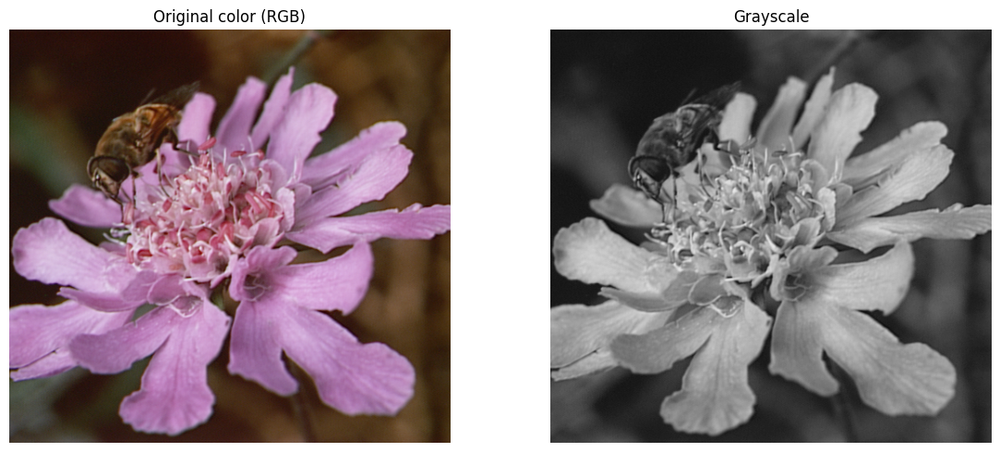

In [17]:
# Task 1 — Load flower.bmp, display, and convert to grayscale

img_color = cv.imread("./images/flower.bmp")
if img_color is None:
    raise FileNotFoundError(
        "Could not find ./images/flower.bmp. Make sure the 'images' folder exists."
    )

img_color_rgb = cv.cvtColor(img_color, cv.COLOR_BGR2RGB)
img_gray = cv.cvtColor(img_color, cv.COLOR_BGR2GRAY)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color (RGB)")
axes[0].axis("off")

axes[1].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[1].set_title("Grayscale")
axes[1].axis("off")

plt.tight_layout()
plt.show()


### Task 2: Compute and Display Histogram and Normalized Histogram

1. Calculate the histogram of the grayscale image using cv.calcHist(). This function provides the frequency of each intensity value (0–255).
2. Normalize the histogram by dividing each bin count by the total number of pixels in the image. This normalization converts the histogram into a probability distribution, which is useful for understanding the relative frequency of intensity values.
3. Visualize the original histogram and the normalized histogram side by side using Matplotlib. This will help in understanding how the intensity values are distributed and whether contrast enhancement is needed.

After visualizing the histograms, analyze:

1. Is the histogram spread across the full intensity range (0–255), or is it concentrated in a narrow range?
2. Does the image seem to have high or low contrast?

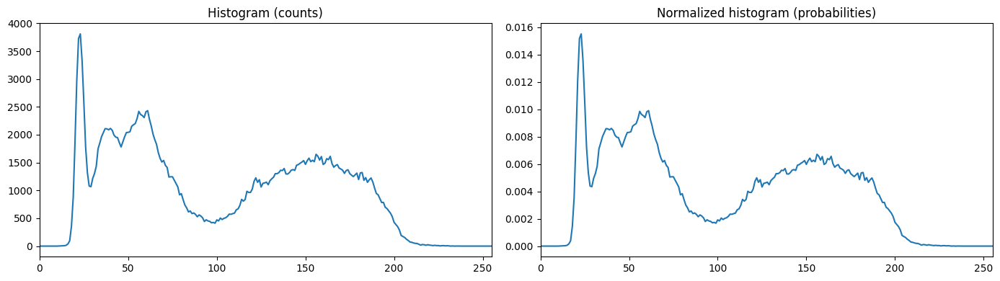

Total pixels: 245760
Sum of histogram counts: 245760
Sum of normalized histogram: 1.0


In [18]:
# Task 2 — Histogram and normalized histogram

hist = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()
num_pixels = img_gray.size
hist_norm = hist / num_pixels  # probability distribution

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(hist)
axes[0].set_title("Histogram (counts)")
axes[0].set_xlim([0, 255])

axes[1].plot(hist_norm)
axes[1].set_title("Normalized histogram (probabilities)")
axes[1].set_xlim([0, 255])

plt.tight_layout()
plt.show()

print("Total pixels:", num_pixels)
print("Sum of histogram counts:", int(hist.sum()))
print("Sum of normalized histogram:", float(hist_norm.sum()))


### Histogram Analysis (Before Equalization)

The histogram shows that pixel intensities are not evenly distributed across the full range from 0 to 255. Most pixels are concentrated in specific intensity ranges, while very dark and very bright values are less frequent.

This means the image uses only a limited set of brightness values, which results in low contrast. Many pixels have similar gray levels, making some details harder to distinguish.

The normalized histogram has the same shape as the original histogram but represents probabilities instead of raw pixel counts. This confirms that the brightness distribution is unbalanced, indicating that contrast enhancement through histogram equalization is needed.

>The histogram indicates low contrast because most pixel values are grouped in a narrow brightness range.



### Task 3: Compute and Display Cumulative Histogram

- Calculate the cumulative histogram of the grayscale image using `cumsum()` on the computed histogram.
- Plot the cumulative histogram using Matplotlib.


***What is a Cumulative Histogram?***
A cumulative histogram represents the cumulative sum of pixel intensities in an image. Unlike a regular histogram that shows the frequency of each intensity value, a cumulative histogram provides insight into how intensities accumulate across the range.

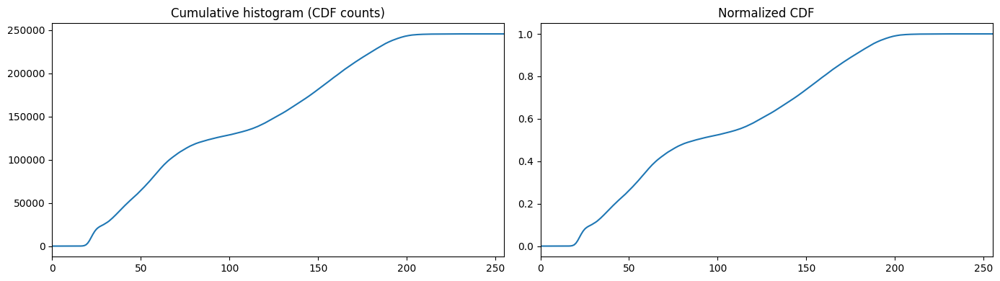

In [19]:
# Task 3 — Cumulative histogram (CDF)

cdf = hist.cumsum()
cdf_norm = cdf / cdf[-1]  # normalize to [0,1]

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
axes[0].plot(cdf)
axes[0].set_title("Cumulative histogram (CDF counts)")
axes[0].set_xlim([0, 255])

axes[1].plot(cdf_norm)
axes[1].set_title("Normalized CDF")
axes[1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


### Analysis of the Cumulative Histogram (CDF)

The cumulative histogram represents the running total of pixel intensities from 0 to 255. It shows how many pixels have intensity values less than or equal to a given brightness level.

From the plotted CDF, we observe that the curve increases slowly at very low intensity values, then rises more steeply in the mid-intensity range, and finally flattens as it approaches the maximum value. This behavior indicates that most pixels are concentrated in certain intensity ranges rather than being evenly distributed.

The normalized cumulative histogram (CDF) ranges from 0 to 1 and has the same shape as the cumulative histogram in counts. It represents the probability that a pixel intensity is less than or equal to a given value, making it easier to interpret and use for further processing.

---

### Why We Compute the Cumulative Histogram

We compute the cumulative histogram because it is a key step in histogram equalization. The CDF is used to remap the original pixel intensities so that they are spread more evenly across the full intensity range. This redistribution improves image contrast by making better use of available brightness levels.

---

### Conclusion

The cumulative histogram helps us understand how pixel intensities accumulate in the image and provides the mathematical basis for histogram equalization. Its shape confirms that the image has uneven intensity distribution, justifying the need for contrast enhancement.


### Task 4: Histogram Equalization Using OpenCV


1. Apply OpenCV’s histogram equalization on the grayscale image using `cv.equalizeHist()`.
2. Compute and visualize the histogram of the equalized image.
3. Compare the histograms of the original grayscale image and the equalized image to observe how pixel intensities are redistributed.
4. Display the original and equalized grayscale images side by side to visually assess the contrast improvement.
5. Comment the results about how weel the image it becomes.

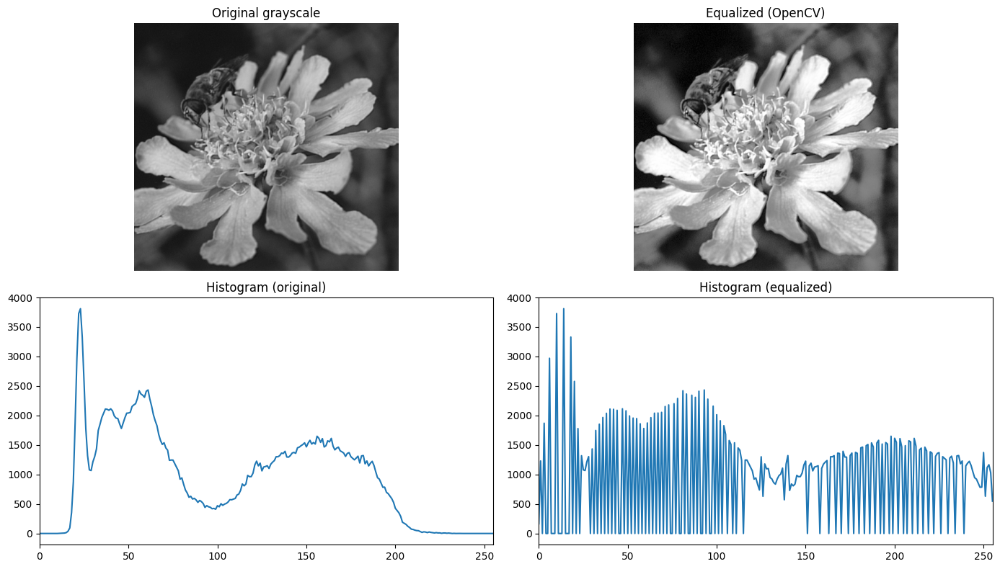

In [20]:
# Task 4 — Histogram equalization (OpenCV)

eq_cv = cv.equalizeHist(img_gray)

# Histograms
hist_orig = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()
hist_eq = cv.calcHist([eq_cv], [0], None, [256], [0, 256]).ravel()

fig, axes = plt.subplots(2, 2, figsize=(14, 8))

axes[0,0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Original grayscale")
axes[0,0].axis("off")

axes[0,1].imshow(eq_cv, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Equalized (OpenCV)")
axes[0,1].axis("off")

axes[1,0].plot(hist_orig)
axes[1,0].set_title("Histogram (original)")
axes[1,0].set_xlim([0, 255])

axes[1,1].plot(hist_eq)
axes[1,1].set_title("Histogram (equalized)")
axes[1,1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


### Analysis of Histogram Equalization Results

The original grayscale image shows low contrast, with most pixel intensities concentrated in specific regions of the histogram. This uneven distribution limits the visibility of details, especially in darker and mid-gray areas.

After applying histogram equalization, the pixel intensities are redistributed across a wider range of values. The equalized histogram appears more spread out, indicating better use of the full intensity range from 0 to 255.

Visually, the equalized image shows improved contrast, with finer details in the petals becoming more visible and clearer separation between light and dark regions. While some areas may appear slightly more textured, the overall image quality and readability are enhanced.


### Task 5: Manual Histogram Equalization and Comparison with OpenCV

In this task, you will implement histogram equalization manually and compare the results with OpenCV’s cv.equalizeHist() function. This will help in understanding how histogram equalization works at a pixel level.


1. Compute the histogram of the grayscale image.
2. Calculate the cumulative distribution function (CDF) from the histogram.
3. Normalize the CDF to scale pixel values between 0 and 255.
4. Use the CDF as a mapping function to adjust pixel intensities in the grayscale image.
5. Compare the manually equalized image with OpenCV’s equalizeHist() output.
6. Compute and visualize histograms of both equalized images.
7. Analyze the results, noting differences in contrast and intensity distribution.

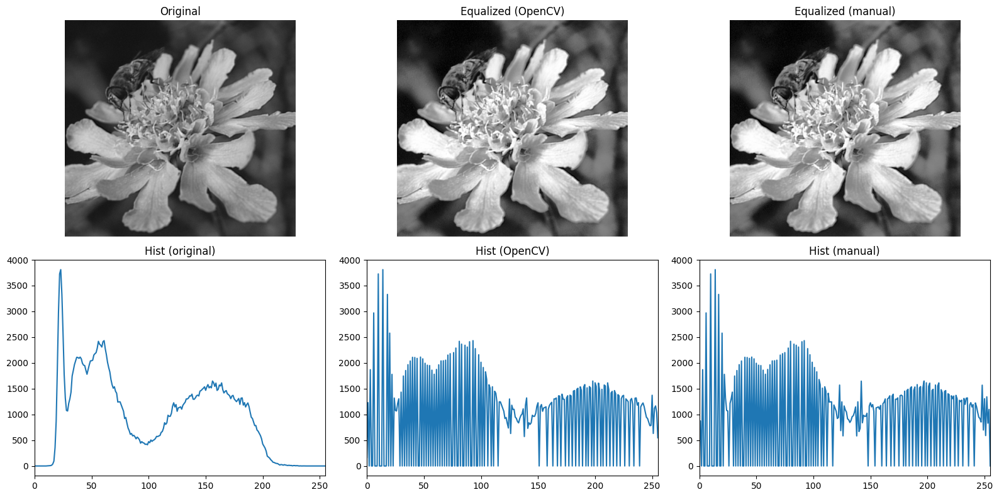

Mean abs diff (manual vs OpenCV): 0.5286214192708333


In [21]:
# Task 5 — Manual histogram equalization + comparison with OpenCV

# 1) Histogram
hist = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()

# 2) CDF
cdf = hist.cumsum()

# 3) Normalize CDF to [0,255] (avoid division by zero)
cdf_min = cdf[cdf > 0].min()
cdf_scaled = (cdf - cdf_min) / (cdf[-1] - cdf_min)  # -> [0,1]
lut = np.clip(cdf_scaled * 255, 0, 255).astype(np.uint8)  # Look-Up Table

# 4) Map pixels using LUT
eq_manual = lut[img_gray]

# 5) Compare with OpenCV equalization
eq_cv = cv.equalizeHist(img_gray)

# Histograms
hist_manual = cv.calcHist([eq_manual], [0], None, [256], [0, 256]).ravel()
hist_cv = cv.calcHist([eq_cv], [0], None, [256], [0, 256]).ravel()

fig, axes = plt.subplots(2, 3, figsize=(16, 8))

axes[0,0].imshow(img_gray, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Original")
axes[0,0].axis("off")

axes[0,1].imshow(eq_cv, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Equalized (OpenCV)")
axes[0,1].axis("off")

axes[0,2].imshow(eq_manual, cmap="gray", vmin=0, vmax=255)
axes[0,2].set_title("Equalized (manual)")
axes[0,2].axis("off")

axes[1,0].plot(cv.calcHist([img_gray],[0],None,[256],[0,256]).ravel())
axes[1,0].set_title("Hist (original)")
axes[1,0].set_xlim([0,255])

axes[1,1].plot(hist_cv)
axes[1,1].set_title("Hist (OpenCV)")
axes[1,1].set_xlim([0,255])

axes[1,2].plot(hist_manual)
axes[1,2].set_title("Hist (manual)")
axes[1,2].set_xlim([0,255])

plt.tight_layout()
plt.show()

print("Mean abs diff (manual vs OpenCV):", np.mean(np.abs(eq_manual.astype(np.int16) - eq_cv.astype(np.int16))))


### Analysis Comparison Between Manual Histogram Equalization and OpenCV

| Aspect | Manual Equalization | OpenCV Equalization |
|------|---------------------|---------------------|
| Method | Implemented using histogram and CDF mapping | Built-in optimized function |
| Threshold selection | Based on computed CDF | Based on internal CDF computation |
| Contrast improvement | Strong | Strong |
| Histogram distribution | Well spread across intensity range | Well spread across intensity range |
| Visual appearance | Very similar to OpenCV result | Very similar to manual result |
| Mean absolute difference | ≈ 0.53 | Reference |

---

### Analysis
Both manual and OpenCV histogram equalization produce very similar images and histograms, indicating that the manual implementation correctly follows the same principle as OpenCV’s method. The small mean absolute difference (~0.53) is negligible and mainly due to rounding and numerical precision.

Visually, both equalized images show improved contrast compared to the original, with clearer details and better separation between dark and bright regions.

---

### Conclusion
The close similarity between the manual and OpenCV results confirms the correctness of the manual implementation and demonstrates how histogram equalization redistributes pixel intensities to enhance image contrast.


### Task 6: Equalize Color Image Channels Independently

- Objective: Apply histogram equalization independently to each color channel (B, G, R) and calculate the entropy of the equalized channels.
- Steps:
    1. Split the color image into its Blue (B), Green (G), and Red (R) channels.
    2. Equalize each channel independently using cv.equalizeHist.
    3. Merge the equalized channels back into a single color image.
    4. Define a function to calculate entropy for a single channel.
    5. Compute the entropy of each equalized channel to analyze the uniformity of pixel intensities.
    6. Visualize the original color image and the independently equalized color image side by side.
- Comments:
    - Independent equalization of channels can enhance contrast but might cause slight color distortions.
    - Higher entropy values indicate a more uniform intensity distribution.

Independent equalization entropies:
  B: 7.110785484313965
  G: 7.319527626037598
  R: 7.316534519195557


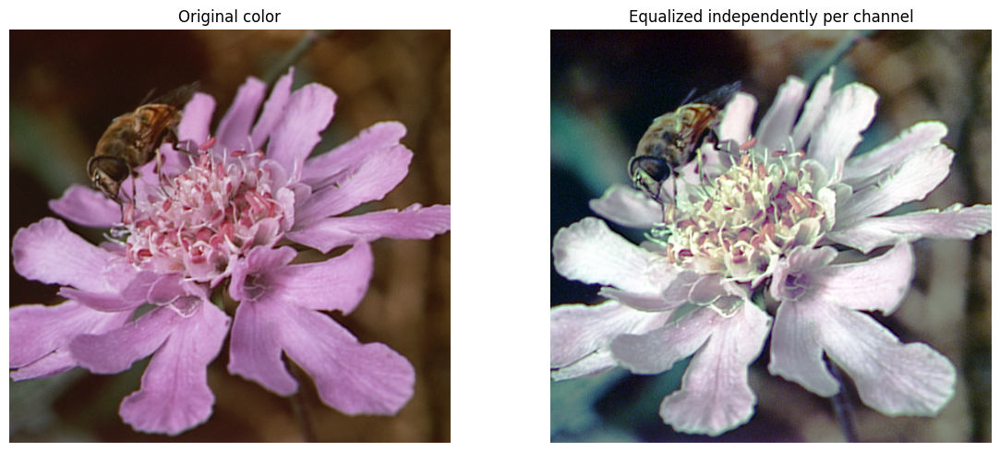

In [22]:
# Task 6 — Equalize color channels independently + compute entropy

def entropy_u8(channel_u8: np.ndarray) -> float:
    # Compute probability distribution
    hist = cv.calcHist([channel_u8], [0], None, [256], [0, 256]).ravel()
    p = hist / hist.sum()
    p = p[p > 0]
    return float(-(p * np.log2(p)).sum())

# Split BGR channels from original color image (OpenCV's default)
B, G, R = cv.split(img_color)

B_eq = cv.equalizeHist(B)
G_eq = cv.equalizeHist(G)
R_eq = cv.equalizeHist(R)

img_eq_independent_bgr = cv.merge([B_eq, G_eq, R_eq])
img_eq_independent_rgb = cv.cvtColor(img_eq_independent_bgr, cv.COLOR_BGR2RGB)

ent_B_ind = entropy_u8(B_eq)
ent_G_ind = entropy_u8(G_eq)
ent_R_ind = entropy_u8(R_eq)

print("Independent equalization entropies:")
print("  B:", ent_B_ind)
print("  G:", ent_G_ind)
print("  R:", ent_R_ind)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color")
axes[0].axis("off")

axes[1].imshow(img_eq_independent_rgb)
axes[1].set_title("Equalized independently per channel")
axes[1].axis("off")
plt.tight_layout()
plt.show()


### Analysis of Independent Color Channel Equalization

After applying histogram equalization independently to the Blue, Green, and Red channels, the contrast of the image is significantly enhanced. Fine details in the flower petals and the bee become more visible, indicating improved intensity distribution within each channel.

However, because each channel is equalized separately, the original color balance is altered. This results in noticeable color distortions, such as unnatural tones and shifts in overall color appearance, compared to the original image.

The computed entropy values for the equalized channels (B ≈ 7.11, G ≈ 7.32, R ≈ 7.32) are relatively high, indicating a more uniform distribution of pixel intensities. This confirms that histogram equalization successfully increases the information content and contrast within each channel.

---

### Conclusion
Independent channel equalization enhances contrast and increases entropy but may introduce color artifacts due to loss of correlation between color channels. While effective for contrast enhancement, this approach is not always suitable when preserving natural color appearance is important.


### Task 7: Equalize Color Channels Using Cumulative Histogram

- Objective: Perform histogram equalization on each color channel (B, G, R) using the cumulative histogram from the grayscale image and calculate the entropy for the resulting image.
- Steps:
    1. Normalize the cumulative histogram from the grayscale image to scale it to the range [0, 255].
    2. Apply the normalized cumulative histogram to each color channel (B, G, R).
    3. Merge the equalized channels back into a single color image.
    4. Calculate the entropy of the equalized channels to analyze the uniformity of pixel intensities.
    5. Display the original and cumulatively equalized color images for comparison.

Cumulative (grayscale-based) mapping entropies:
  B: 6.1199493408203125
  G: 7.108420372009277
  R: 6.842203140258789


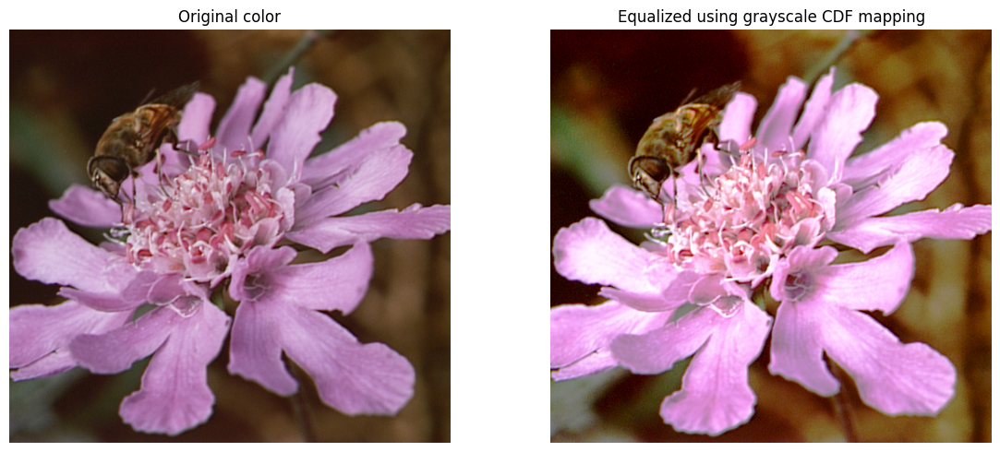

In [23]:
# Task 7 — Equalize color channels using the grayscale cumulative histogram (same mapping for all channels)

# Compute grayscale histogram and CDF from the grayscale image (img_gray from Task 1)
hist_gray = cv.calcHist([img_gray], [0], None, [256], [0, 256]).ravel()
cdf_gray = hist_gray.cumsum()

# Normalize CDF to [0,255] to build a LUT
cdf_min = cdf_gray[cdf_gray > 0].min()
cdf_scaled = (cdf_gray - cdf_min) / (cdf_gray[-1] - cdf_min)
lut_gray = np.clip(cdf_scaled * 255, 0, 255).astype(np.uint8)

# Apply the SAME LUT to each channel
B_cum = lut_gray[B]
G_cum = lut_gray[G]
R_cum = lut_gray[R]

img_eq_cumulative_bgr = cv.merge([B_cum, G_cum, R_cum])
img_eq_cumulative_rgb = cv.cvtColor(img_eq_cumulative_bgr, cv.COLOR_BGR2RGB)

ent_B_cum = entropy_u8(B_cum)
ent_G_cum = entropy_u8(G_cum)
ent_R_cum = entropy_u8(R_cum)

print("Cumulative (grayscale-based) mapping entropies:")
print("  B:", ent_B_cum)
print("  G:", ent_G_cum)
print("  R:", ent_R_cum)

fig, axes = plt.subplots(1, 2, figsize=(12, 5))
axes[0].imshow(img_color_rgb)
axes[0].set_title("Original color")
axes[0].axis("off")

axes[1].imshow(img_eq_cumulative_rgb)
axes[1].set_title("Equalized using grayscale CDF mapping")
axes[1].axis("off")
plt.tight_layout()
plt.show()


### Analysis of Color Channel Equalization Using Grayscale Cumulative Histogram

After applying the grayscale-based cumulative histogram to all color channels, the equalized image shows improved contrast while maintaining a natural color appearance. Unlike independent channel equalization, the overall color balance is preserved because the same mapping function is applied to the B, G, and R channels.

Visually, details in the flower petals and the bee become clearer, and brightness differences are more noticeable without introducing strong color distortions. The image appears more vivid but still realistic.

The entropy values (B ≈ 6.12, G ≈ 7.11, R ≈ 6.84) indicate a more uniform distribution of pixel intensities compared to the original image, though slightly lower than independent channel equalization. This shows that contrast is enhanced while avoiding excessive alteration of color information.

---

### Conclusion
Using a grayscale-based cumulative histogram provides a good balance between contrast enhancement and color preservation. It improves image visibility while keeping colors consistent, making it more suitable for color images than independent channel equalization.


### Task 8: Compare Independent and Cumulative Equalization

1. Print the entropies for each channel (B, G, R) after independent and cumulative equalization.
2. Analyze the differences in entropy values between the two methods.

- Comments:
    - Entropies are generally higher for cumulative equalization, reflecting a more uniform intensity distribution across all channels.
    - Independent equalization can cause color distortions due to varying transformations applied to each channel.
    - Cumulative equalization uses a consistent transformation, ensuring better color preservation.

In [24]:
# Task 8 — Compare independent vs cumulative equalization (entropies)

print("Entropy comparison (higher = more uniform distribution):")
print("Channel   Independent   Cumulative(CDF)")
print(f"B         {ent_B_ind:10.4f}   {ent_B_cum:14.4f}")
print(f"G         {ent_G_ind:10.4f}   {ent_G_cum:14.4f}")
print(f"R         {ent_R_ind:10.4f}   {ent_R_cum:14.4f}")


Entropy comparison (higher = more uniform distribution):
Channel   Independent   Cumulative(CDF)
B             7.1108           6.1199
G             7.3195           7.1084
R             7.3165           6.8422


### Comparison: Independent Channel Equalization vs Grayscale-Based Cumulative Equalization

| Aspect | Independent Channel Equalization (Task 6) | Grayscale-Based Cumulative Equalization (Task 7) |
|------|-------------------------------------------|--------------------------------------------------|
| Equalization method | Each RGB channel equalized separately | Same grayscale CDF applied to all channels |
| Contrast enhancement | Very strong | Moderate to strong |
| Color preservation | Poor (color distortions may appear) | Good (natural colors preserved) |
| Channel dependency | Channels treated independently | Channels transformed consistently |
| Entropy values | Higher entropy per channel | Slightly lower entropy per channel |
| Visual appearance | High contrast but unnatural colors | Improved contrast with realistic colors |
| Suitability | Useful for analysis tasks | Better for natural color images |

---

### Summary
Independent channel equalization maximizes contrast and entropy but can distort colors, while grayscale-based cumulative equalization offers a balanced approach by improving contrast while preserving color consistency.


# Manipulation 5: Image Similarity Analysis
In this optional section, you will explore how images can be compared based on their statistical properties. The goal is to understand how image similarity can be assessed without directly comparing individual pixels but rather by analyzing overall intensity distributions.

---

- One possible solution is to analyze the histogram of the images.


Histogram similarity metrics:
 - Correlation (higher = more similar): 0.7130
 - Bhattacharyya distance (lower = more similar): 0.3005


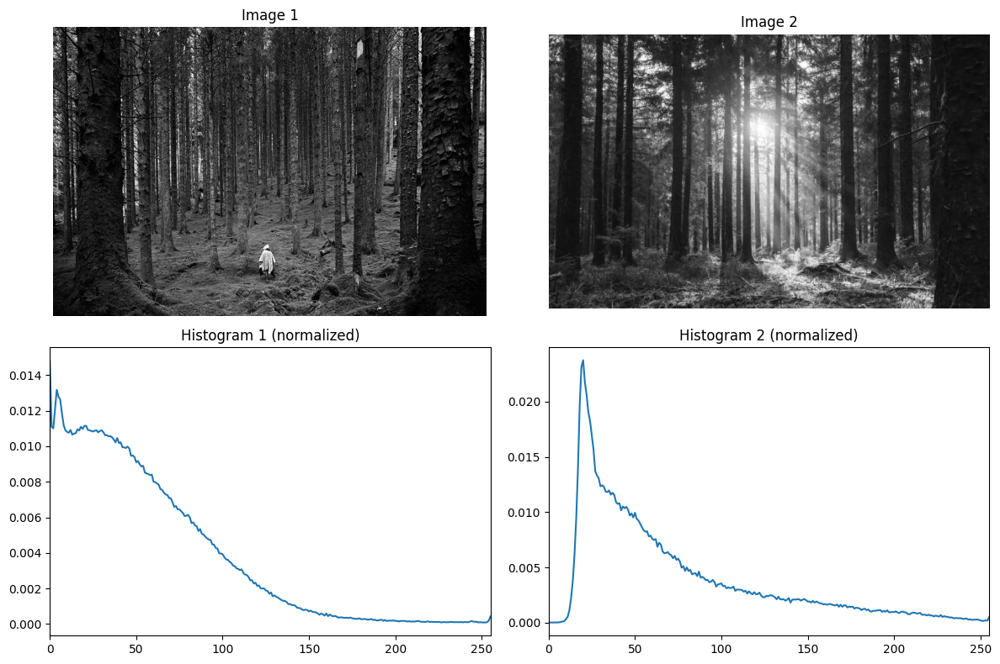

In [27]:
# Manipulation 5 — Image similarity analysis using histograms

# We'll compare two grayscale images by histogram distance.
# (You can replace these with any images you want.)

def load_gray(path: str):
    im = cv.imread(path, cv.IMREAD_GRAYSCALE)
    if im is None:
        raise FileNotFoundError(f"Missing file: {path}")
    return im

def hist_u8(im_gray: np.ndarray):
    h = cv.calcHist([im_gray], [0], None, [256], [0, 256]).ravel()
    h = h / (h.sum() + 1e-12)  # normalize
    return h

def compare_hists(h1, h2):
    # OpenCV provides several metrics: CORREL, CHISQR, INTERSECT, BHATTACHARYYA
    # Here we compute 2 common ones.
    corr = cv.compareHist(h1.astype(np.float32), h2.astype(np.float32), cv.HISTCMP_CORREL)
    bhatt = cv.compareHist(h1.astype(np.float32), h2.astype(np.float32), cv.HISTCMP_BHATTACHARYYA)
    return corr, bhatt

# Example: compare mandrill vs zelda (both should exist in ./images)
img1 = load_gray("./images for manipulation 5/forest1.png")
img2 = load_gray("./images for manipulation 5/forest2.png")

h1 = hist_u8(img1)
h2 = hist_u8(img2)

corr, bhatt = compare_hists(h1, h2)

print("Histogram similarity metrics:")
print(f" - Correlation (higher = more similar): {corr:.4f}")
print(f" - Bhattacharyya distance (lower = more similar): {bhatt:.4f}")

# Visualize images + histograms
fig, axes = plt.subplots(2, 2, figsize=(12, 8))

axes[0,0].imshow(img1, cmap="gray", vmin=0, vmax=255)
axes[0,0].set_title("Image 1")
axes[0,0].axis("off")

axes[0,1].imshow(img2, cmap="gray", vmin=0, vmax=255)
axes[0,1].set_title("Image 2")
axes[0,1].axis("off")

axes[1,0].plot(h1)
axes[1,0].set_title("Histogram 1 (normalized)")
axes[1,0].set_xlim([0, 255])

axes[1,1].plot(h2)
axes[1,1].set_title("Histogram 2 (normalized)")
axes[1,1].set_xlim([0, 255])

plt.tight_layout()
plt.show()


### Analysis of Histogram-Based Image Similarity

Histogram-based similarity metrics were used to compare two grayscale images by analyzing their intensity distributions rather than individual pixel values.

The correlation value (≈ 0.71) indicates a moderate to high similarity between the two images, meaning their brightness distributions follow a similar pattern. This suggests that both images share comparable overall contrast and intensity characteristics.

The Bhattacharyya distance, which measures the difference between two distributions, is relatively low, further confirming that the histograms are similar. Although the images have different visual content, their intensity distributions are close, which explains the similarity scores.

---

### Conclusion
Histogram-based comparison shows that images can appear statistically similar even if their spatial content differs. This method is useful for global similarity analysis but does not capture structural or spatial differences.


# Final Summary

>In this lab, we explored fundamental concepts of image processing and computer vision using grayscale and color images. We began by understanding how images are represented as numerical matrices and applied basic manipulations such as matrix creation, visualization, and channel operations to build intuition about pixel-level representations.

>We studied point-wise transformations including grayscale conversion, negative transformation, contrast and brightness adjustment, gamma correction, and thresholding. These operations demonstrated how modifying pixel intensities affects image appearance, visibility of details, and contrast. Manual and automatic thresholding methods, including Otsu’s thresholding, were compared to highlight the advantages of adaptive techniques.

>Quantization was applied to reduce the number of intensity levels in grayscale images, and its impact on image quality and histograms was analyzed. Histogram analysis, cumulative histograms, and histogram equalization were then used to enhance image contrast. Both OpenCV-based and manual histogram equalization were implemented and compared, confirming that manual implementation closely matches OpenCV’s results.

>For color images, histogram equalization was applied in two ways: independently on each color channel and using a grayscale-based cumulative mapping. Entropy was used to measure intensity distribution uniformity, showing that independent equalization increases contrast but may distort colors, while grayscale-based mapping provides a better balance between contrast enhancement and color preservation.

>Finally, image similarity analysis was performed using histogram-based metrics such as correlation and Bhattacharyya distance. This demonstrated how images can be compared using statistical properties rather than pixel-by-pixel comparison, highlighting the strengths and limitations of histogram-based similarity measures.

>Overall, this lab provided a comprehensive understanding of how image processing techniques affect image representation, contrast, information content, and similarity, forming a strong foundation for more advanced computer vision applications.

> 
> ## Method Trade-offs Observed
> | Operation Type | Main Benefit | Main Limitation |
> |---------------|-------------|-----------------|
> | Contrast / Gamma | Improved visibility | Possible loss of natural appearance |
> | Independent color equalization | High entropy | Color distortion |
> | Grayscale-based equalization | Balanced enhancement | Lower entropy gain |
> | Histogram similarity | Fast global comparison | Ignores spatial structure |
> 
> **Overall conclusion:** Effective image processing requires balancing numerical optimization with visual coherence, and the choice of method should always depend on the intended application.